In [2]:
%%HTML
<style> code {background-color : pink !important;} </style>

Camera Calibration with OpenCV
===

### Run the code in the cell below to extract object points and image points for camera calibration.  

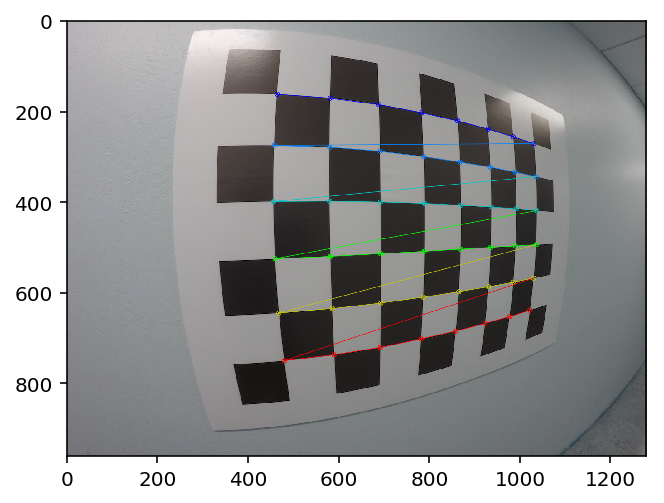

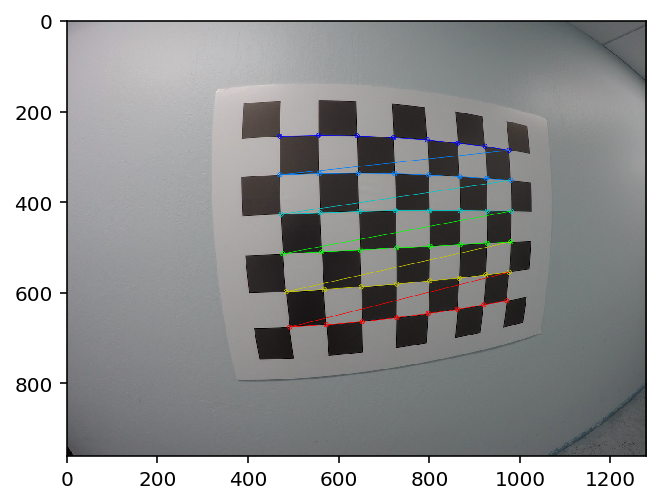

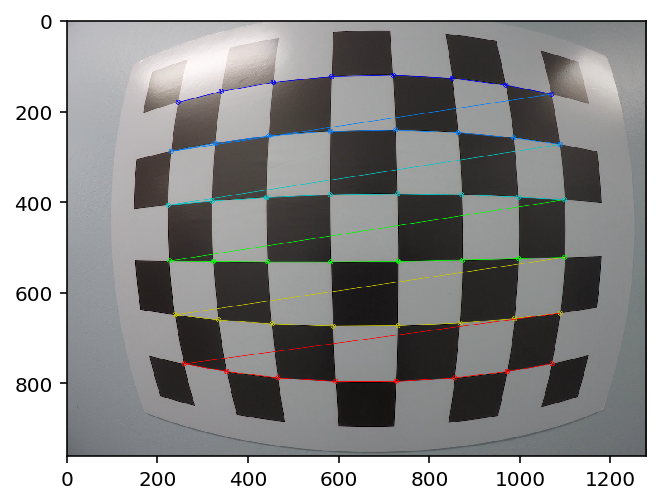

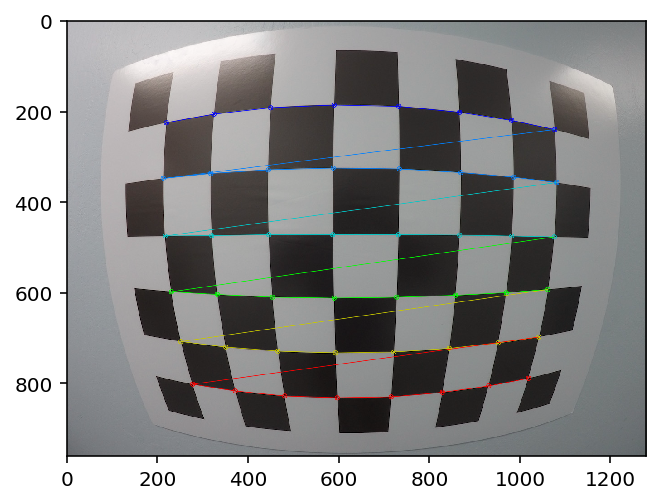

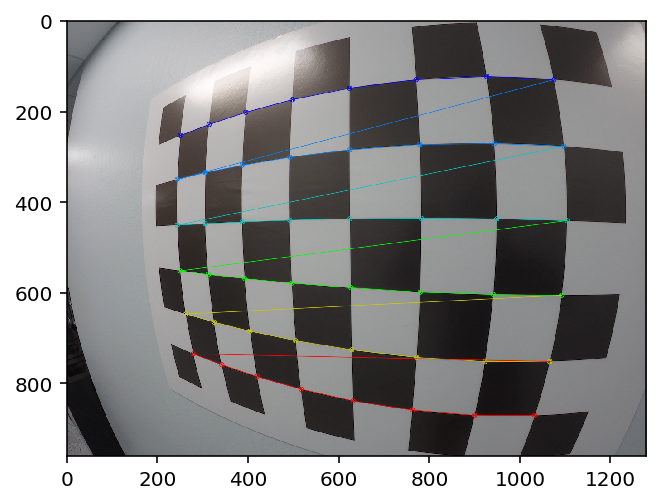

...

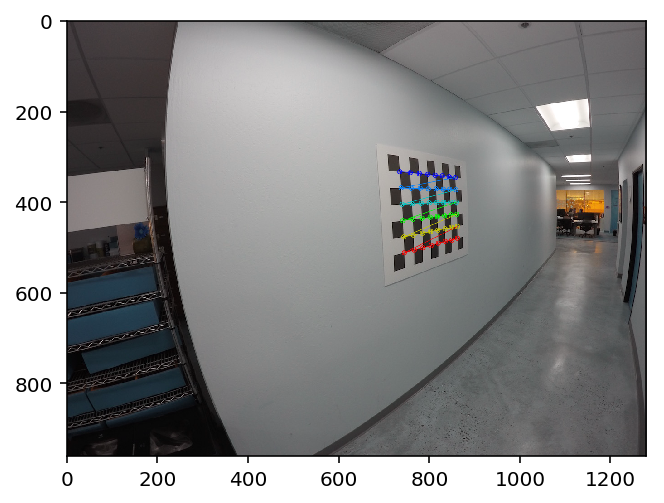

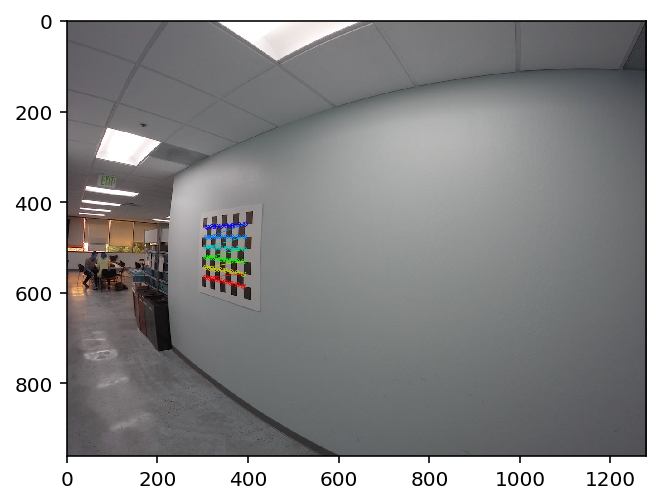

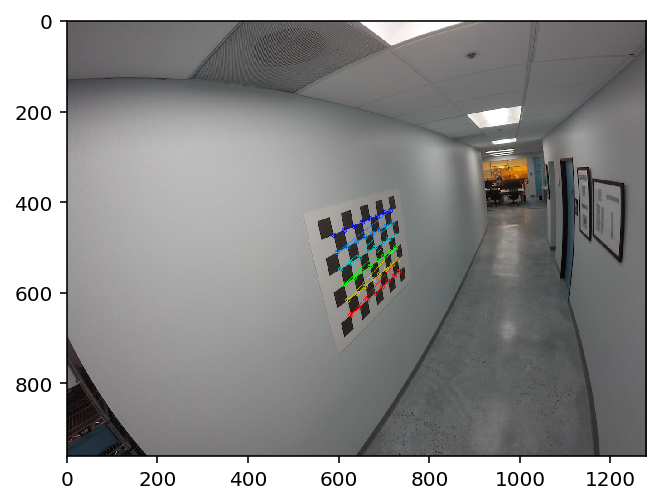

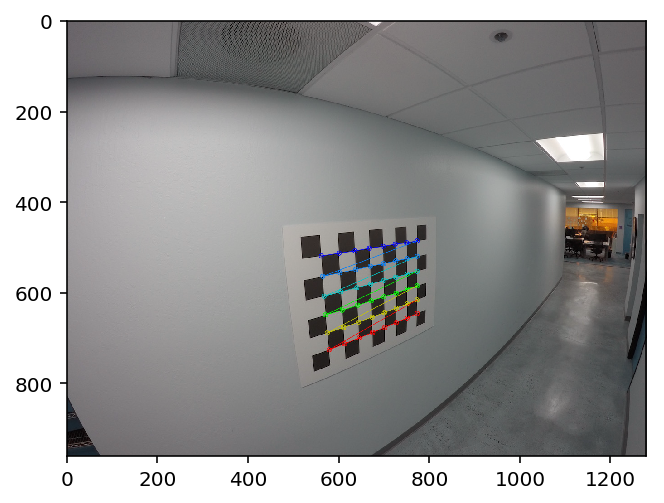

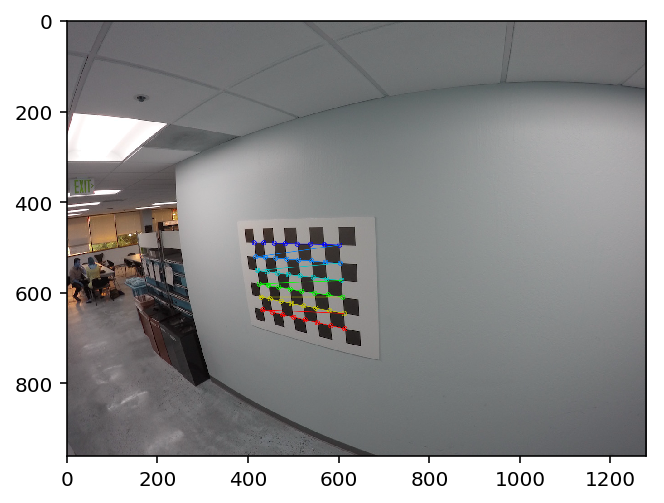

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
from time import sleep

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*8,3), np.float32)
objp[:,:2] = np.mgrid[0:8, 0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('calibration_wide/GO*.jpg')

# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (8,6), None)
    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        cv2.drawChessboardCorners(img, (8,6), corners, ret)
        #write_name = 'corners_found'+str(idx)+'.jpg'
        #cv2.imwrite(write_name, img)
        plt.imshow(img)
        plt.show()
        #cv2.imshow('img', img)
        sleep(0.1) # Time in seconds.



### If the above cell ran sucessfully, you should now have `objpoints` and `imgpoints` needed for camera calibration.  Run the cell below to calibrate, calculate distortion coefficients, and test undistortion on an image!

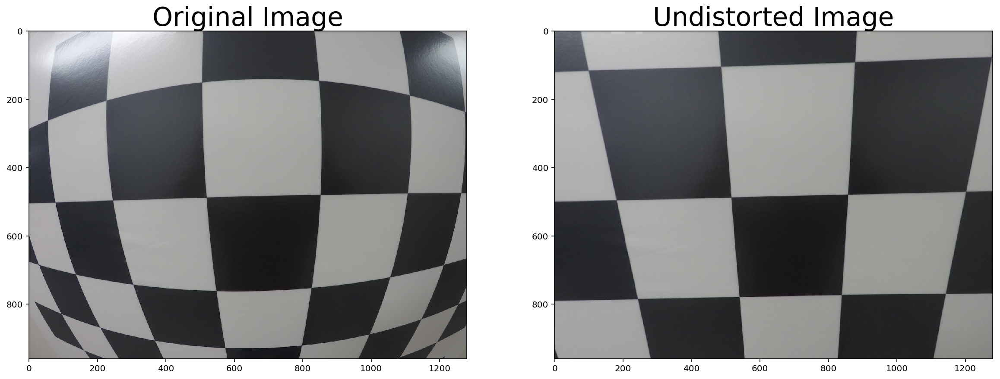

In [5]:
import pickle
%matplotlib inline

# Test undistortion on an image
img = cv2.imread('calibration_wide/test_image.jpg')
img_size = (img.shape[1], img.shape[0])
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)   

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)


dst = cv2.undistort(img, mtx, dist, None, mtx)
cv2.imwrite('calibration_wide/test_undist.jpg',dst)

# Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "calibration_wide/wide_dist_pickle.p", "wb" ) )
#dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)

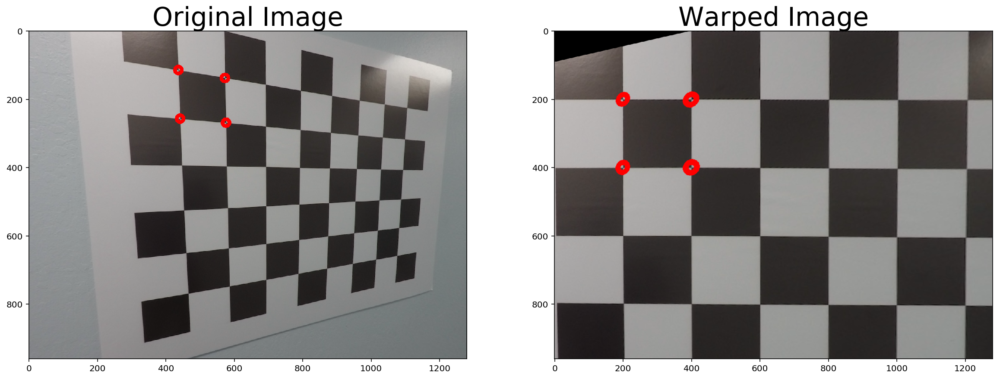

In [3]:
test_raw = cv2.imread('calibration_wide/GOPR0032.jpg')
test_img = cv2.undistort(test_raw, mtx, dist, None, mtx)
test_gray = cv2.cvtColor(test_img, cv2.COLOR_BGR2GRAY)

# Find the chessboard corners
ret, corners = cv2.findChessboardCorners(test_gray, (8,6), None)
# If found, add object points, image points

corners = np.squeeze(corners)

nx = 8
box_corners = [corners[0],corners[1],corners[0 + 8],corners[1 + 8]]
#offset = 100
#box_corners = np.float32([corners[0], corners[nx-1], corners[-1], corners[-nx]])
# dst = np.float32([[offset, offset], [img_size[0]-offset, offset], 
#                                     [img_size[0]-offset, img_size[1]-offset], 
#                                     [offset, img_size[1]-offset]])


for corner in box_corners:
    cv2.circle(test_img, (corner[0],corner[1]),10, (255, 0, 0), 10)

src = np.squeeze(box_corners)
dst = np.float32(
    [[200,200],
     [400, 200],
     [200, 400],
     [400, 400]
     ])

M = cv2.getPerspectiveTransform(src, dst)
warped = cv2.warpPerspective(test_img, M, (test_img.shape[1], test_img.shape[0]), flags=cv2.INTER_LINEAR)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(test_img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(warped)
ax2.set_title('Warped Image', fontsize=30)


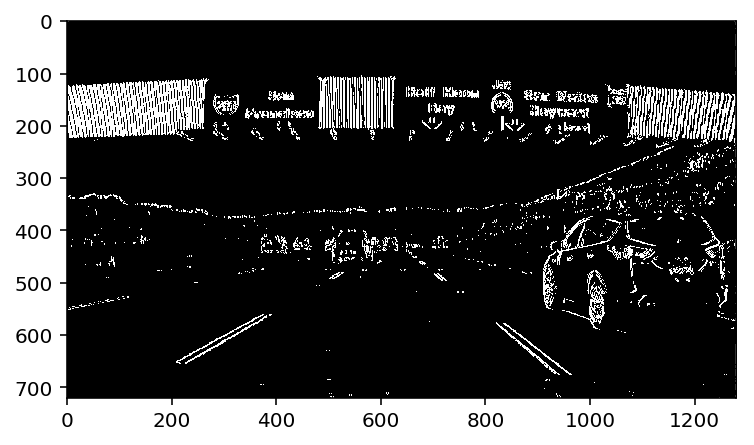

In [4]:
img = cv2.imread('./signs_vehicles_xygrad.png')

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
abs_sobelx = np.absolute(sobelx)
scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

thresh_min = 20
thresh_max = 100
sxbinary = np.zeros_like(scaled_sobel)
sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
plt.imshow(sxbinary, cmap='gray')

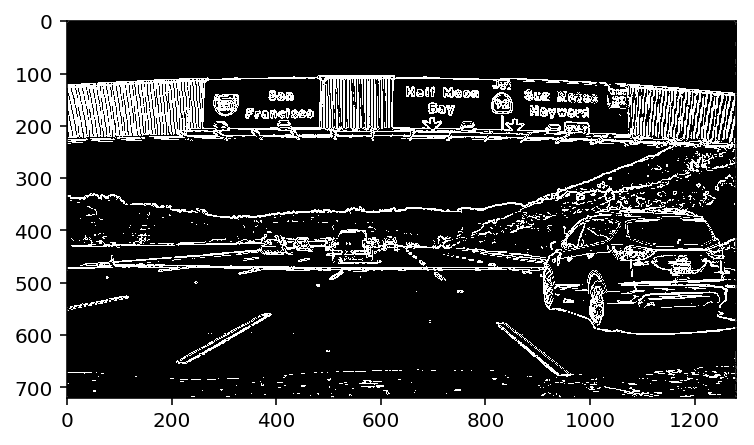

In [5]:
sobel_kernel=3
mag_thresh=(20, 100)

img = cv2.imread('./signs_vehicles_xygrad.png')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)


abs_sobel = np.sqrt((sobelx)**2 + (sobely)**2)

scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))

thresh_min = mag_thresh[0]
thresh_max = mag_thresh[1]

sxbinary = np.zeros_like(scaled_sobel)
sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

plt.imshow(sxbinary, cmap='gray')




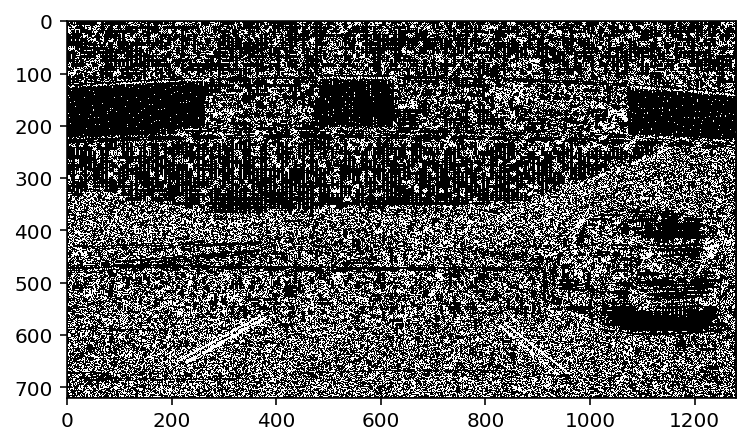

In [6]:
sobel_kernel=3
thresh=(0, np.pi/2)

thresh = (0.7, 1.3)

img = cv2.imread('./signs_vehicles_xygrad.png')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)

direction = np.arctan2(np.absolute(sobely), np.absolute(sobelx)) 

thresh_min = thresh[0]
thresh_max = thresh[1]

sxbinary = np.zeros_like(direction)
sxbinary[(direction >= thresh_min) & (direction <= thresh_max)] = 1

plt.imshow(sxbinary, cmap='gray')

In [11]:
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    dx = 1 if orient == 'x' else 0
    dy = 1 if orient == 'y' else 0
    
    sobelx = cv2.Sobel(gray, cv2.CV_64F, dx, dy, ksize=sobel_kernel)
    
    abs_sobelx = np.absolute(sobelx)
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    thresh_min = thresh[0]
    thresh_max = thresh[1]
    
    grad_binary = np.zeros_like(scaled_sobel)
    grad_binary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
 
    return grad_binary

def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)


    abs_sobel = np.sqrt((sobelx)**2 + (sobely)**2)

    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))

    thresh_min = mag_thresh[0]
    thresh_max = mag_thresh[1]

    mag_binary = np.zeros_like(scaled_sobel)
    mag_binary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    return mag_binary

def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)

    direction = np.arctan2(np.absolute(sobely), np.absolute(sobelx)) 

    thresh_min = thresh[0]
    thresh_max = thresh[1]

    dir_binary = np.zeros_like(direction)
    dir_binary[(direction >= thresh_min) & (direction <= thresh_max)] = 1

    return dir_binary

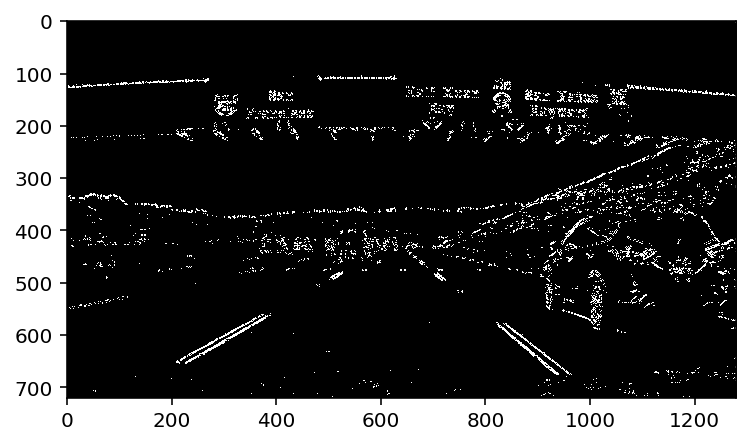

In [27]:
img = cv2.imread('./signs_vehicles_xygrad.png')
gradx = abs_sobel_thresh(img, orient='x', thresh=(20, 100))
grady = abs_sobel_thresh(img, orient='y', thresh=(20, 100))
mag_binary = mag_thresh(img, mag_thresh=(20, 100))
dir_binary = dir_threshold(img, sobel_kernel=5, thresh=(0.7, 1.3))

combined = np.zeros_like(dir_binary)
combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1

plt.imshow(combined, cmap='gray')

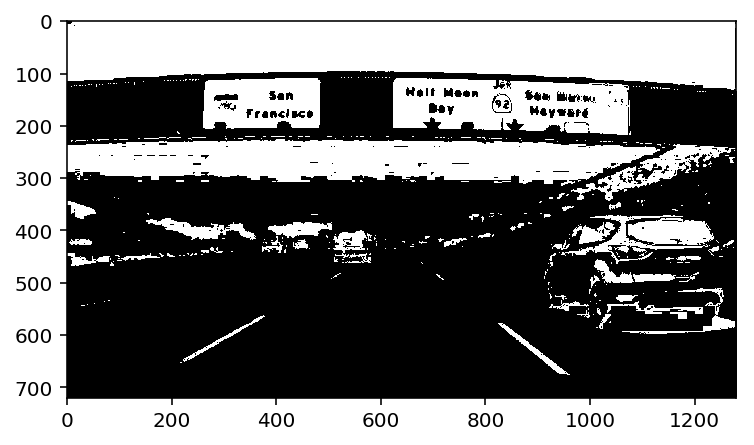

In [44]:
img = cv2.imread('./signs_vehicles_xygrad.png')


def hls_threshold(img,thresh=(90,255)):

    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)

    H = hls[:,:,0]
    L = hls[:,:,1]
    S = hls[:,:,2]

    binary = np.zeros_like(S)
    binary[(S > thresh[0]) & (S <= thresh[1])] = 1
    
    return binary


hls_binary = hls_threshold(img)

plt.imshow(hls_binary, cmap='gray')

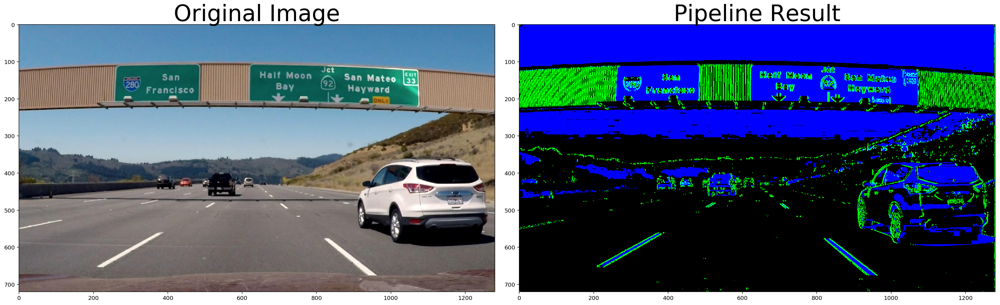

In [68]:
img = cv2.imread('./signs_vehicles_xygrad.png')

image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
hls_binary = hls_threshold(img,thresh=(90,255))
gradx = abs_sobel_thresh(img, orient='x', thresh=(20, 100))

result = np.dstack(( np.zeros_like(gradx), gradx, hls_binary)) * 255



# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(result)
ax2.set_title('Pipeline Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [86]:
img = cv2.imread('./signs_vehicles_xygrad.png')
hls_binary = hls_threshold(img)

nonzero = hls_binary.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])

good_left_inds = ((nonzeroy >= 600) & (nonzeroy < 700) & (nonzerox >= 0) &  (nonzerox < 400)) #.nonzero()[0]


print(len(good_left_inds))
print(len(good_left_inds.nonzero()[0]))

310086
645
